# Task 3 : Super-Resolution using Random Fourier Features (RFF) [4 Marks]

In [ ]:
!pip install torcheval

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 1.9 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [ ]:
# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')
#import modules
import torch
from torchvision.io import read_image
import torchvision.transforms.v2 as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
from sklearn import preprocessing
import torch.nn as nn
import torch.nn.functional as F
import cv2
from torcheval.metrics import PeakSignalNoiseRatio, MeanSquaredError

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

## 1) Super-resolution: 
#### Perform superresolution on the image shown in notebook to enhance its resolution by factor 2. Show a qualitative comparison of original and reconstructed image. (i.e display original image and the image you created side by side) [3 Marks]

In [ ]:
# utility functions
def show_one_img(img: torch.Tensor):
    """Show one image."""
    plt.imshow(img)
    plt.axis('off')
    plt.show()

torch.Size([1081, 1921, 3])


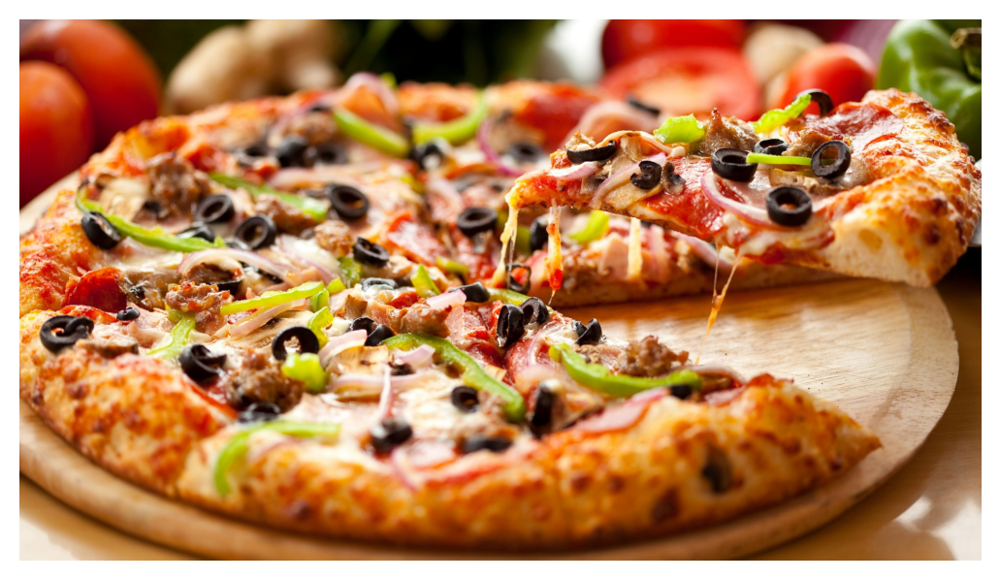

In [ ]:
filename = "/kaggle/input/images/pizza.jpg"
img = read_image(filename).permute(1, 2, 0)
print(img.shape)
show_one_img(img)

In [ ]:
scaler = preprocessing.MinMaxScaler()
scaled_img_numpy = scaler.fit_transform(img.reshape(-1, 1)).reshape(img.shape)
scaled_img = torch.tensor(scaled_img_numpy)
scaled_img[0, 0:5, :]                                     # seeing some values

tensor([[0.5765, 0.4392, 0.4314],
        [0.5765, 0.4392, 0.4314],
        [0.5765, 0.4392, 0.4314],
        [0.5765, 0.4392, 0.4314],
        [0.5686, 0.4314, 0.4235]], dtype=torch.float64)

torch.Size([400, 400, 3])


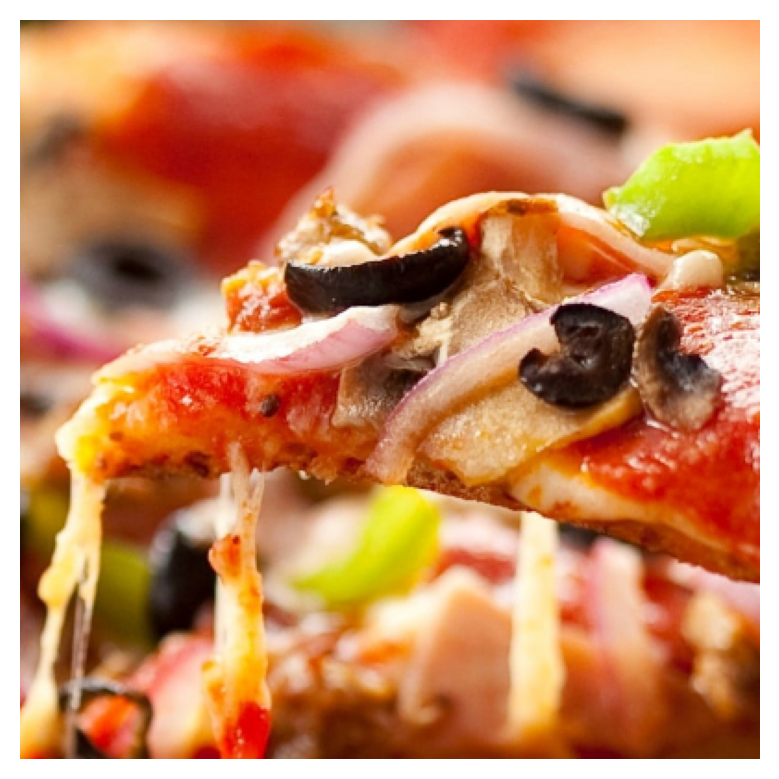

In [ ]:
cropped_img = transforms.functional.crop(scaled_img.permute(2, 0, 1), 130, 950, 400, 400).permute(1, 2, 0)    # since crop takes tensor in CHW format, we permute
print(cropped_img.shape)
show_one_img(cropped_img)

In [ ]:
downsampled_img = torch.tensor(cv2.resize(cropped_img.numpy(), (200, 200)), device = device)

In [ ]:
def plot_images(images: list[torch.Tensor], titles: list[str], title=""):
    n = len(images)  # number of images
    fig = plt.figure(figsize=(6 * n, 8))
    gs = gridspec.GridSpec(1, n, width_ratios=[1] * n)

    axes = [plt.subplot(gs[i]) for i in range(n)]

    for i, (img, sup) in enumerate(zip(images, titles)):
        axes[i].imshow(img.cpu())
        axes[i].set_title(sup)
        axes[i].axis("off")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()
    plt.show()

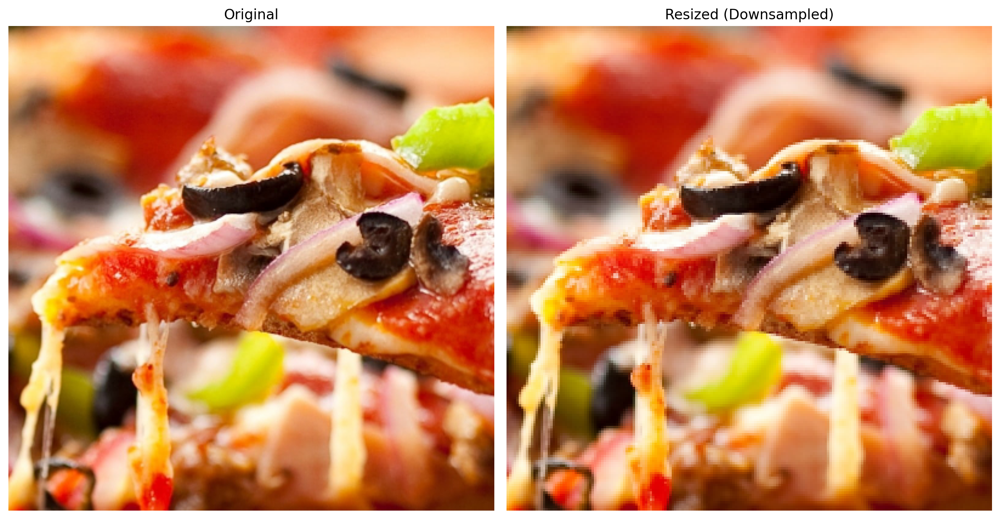

(torch.Size([400, 400, 3]), torch.Size([200, 200, 3]))

In [ ]:
cropped_img = cropped_img.to(device)
plot_images([cropped_img, downsampled_img], ["Original", "Resized (Downsampled)"])
cropped_img.shape, downsampled_img.shape

In [ ]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)


def create_coordinate_map(img: torch.Tensor)-> tuple[torch.Tensor, torch.Tensor]:
    """
    img shape: (height, width, num_channels)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    height, width, num_channels = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1)

    # Reshape image for mapping
    Y = img.reshape(-1, num_channels)
    return X, Y


# initializing RBF sampler
from sklearn.kernel_approximation import RBFSampler
# function to create RFF features
def create_rff_features(X:torch.Tensor, num_features: int, sigma: float):
    """
    creates feature space using Radial basis function on Random fourier features on the tensor X  
    X (torch.Tensor): input tensor  
    num_features: number of features to generate  
    sigma: sigma to calculate gamma of RBF kernel   
    """
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state=696)    # manually seeding to maintain reproducibility across function calls.
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)


def train(net: nn.Module, lr: float, X:torch.Tensor, Y:torch.Tensor, epochs: int, verbose=True)->float:
    """
    net: torch.nn.Module  
    lr: float  
    X: torch.Tensor of shape (num_samples, 2)  
    Y: torch.Tensor of shape (num_samples, 3)  
    returns:  
    final MSE loss value after training
    """
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    Y = Y.float()

    for epoch in range(epochs+1):
        optimizer.zero_grad()
        outputs = net(X)
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()

        if verbose and epoch % 500 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")

    return loss.item()

In [ ]:
#getting coordinate mapping and scaling the coordinate values of the pixels
X_coords, Y_values = create_coordinate_map(downsampled_img)

# MinMaxScaler from -1 to 1
X_coords_scaled = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit_transform(X_coords)
# converting to float32 tensor
X_coords_scaled = torch.tensor(X_coords_scaled, device=device).float()
X_coords_scaled.shape

torch.Size([40000, 2])

In [ ]:
# function to train model, super-sample image and calculate errors.
def super_sample_with_rff(X: torch.Tensor, X_img_shape: tuple[int, int, int], Y: torch.Tensor, num_rff, scale=2) -> tuple[float, float]:
    """
    Reconstructs an image using the Radial Frequency Features (RFF) of the input tensor X.  
    """
    sigma = 0.008
    epochs = 2000
    X_coords_rff = create_rff_features(X, num_rff, sigma)  # 0.008 seems to be an ideal value
    print("Training from input tensor (X) of size:", X_coords_rff.shape)
    # initialize model
    rff_model = LinearModel(X_coords_rff.shape[1], Y.shape[1])
    rff_model.to(device)

    # train model and get final loss after training
    loss = train(rff_model, 0.005, X_coords_rff, Y, epochs)
    
    height, width, num_channels = X_img_shape[0], X_img_shape[1], X_img_shape[2]  
    
    # make feature space for super res image prediction 
    # Create a 2D grid of (x,y) coordinates (h, w)
    w_coords = torch.arange(0, width, 1/scale).repeat(height * scale, 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(width * scale, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor and create RFFs space
    X_coords_super_res = torch.stack([h_coords, w_coords], dim=1).float()
    # MinMaxScaler from -1 to 1
    X_coords_super_res_scaled = torch.tensor(preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit_transform(X_coords_super_res), device=device).float()
    
    X_super_res_rff = create_rff_features(X_coords_super_res_scaled, num_rff, sigma)
    print("Making Super-Res image from input tensor (X) of size:", X_super_res_rff.shape)
    
    height, width, num_channels = X_img_shape[0] * scale, X_img_shape[1] * scale, X_img_shape[2]    
    rff_model.eval()
    with torch.inference_mode():
        #getting low res prediction first for seeing how well the model has learned on the small resolution
        output = rff_model(X_coords_rff)
        learned_img = output.reshape(X_img_shape[0], X_img_shape[1], X_img_shape[2])
        #getting super res prediction
        output = rff_model(X_super_res_rff)
        generated_img = output.reshape(height, width, num_channels)
    
    # show img as well as get the generated image to return it
    plot_images([cropped_img, learned_img.clip(0, 1), generated_img.clip(0, 1)], [f"Original ({height}x{width})", f"Learned (LowRes - {X_img_shape[0]}x{X_img_shape[1]})", f"Reconstructed SuperRes from Downsampled Image ({height}x{width})"], title=f"Super-Sampling using Linear Regression on RFF ({num_rff} features)")
    
    # calculate mse and psnr between original 400px image and generated 400px image
    mse = MeanSquaredError(device=device)
    mse.update(generated_img.reshape(-1), cropped_img.reshape(-1))
    mse_val = mse.compute().item()
    psnr = PeakSignalNoiseRatio(device=device)
    psnr.update(generated_img.reshape(-1), cropped_img.reshape(-1))
    psnr_val = psnr.compute().item()
    
    #cleanup
    del X_coords_rff
    del rff_model
    del X_super_res_rff
    torch.cuda.empty_cache()
    
    return mse_val, psnr_val

In [ ]:
metrics = {}

Training from input tensor (X) of size: torch.Size([40000, 5000])
Epoch 0 loss: 0.362779
Epoch 500 loss: 0.038016
Epoch 1000 loss: 0.035847
Epoch 1500 loss: 0.035036
Epoch 2000 loss: 0.034604
Making Super-Res image from input tensor (X) of size: torch.Size([160000, 5000])


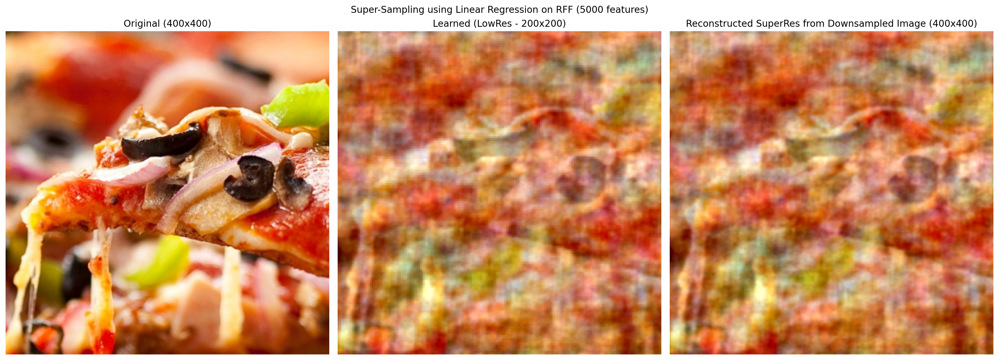

In [ ]:
loss, psnr = super_sample_with_rff(X_coords_scaled, downsampled_img.shape, Y_values, 5000, 2)
metrics[5000] = {'loss':loss, 'psnr':psnr}

Training from input tensor (X) of size: torch.Size([40000, 15000])
Epoch 0 loss: 0.363113
Epoch 500 loss: 0.007104
Epoch 1000 loss: 0.002534
Epoch 1500 loss: 0.001373
Epoch 2000 loss: 0.000991
Making Super-Res image from input tensor (X) of size: torch.Size([160000, 15000])


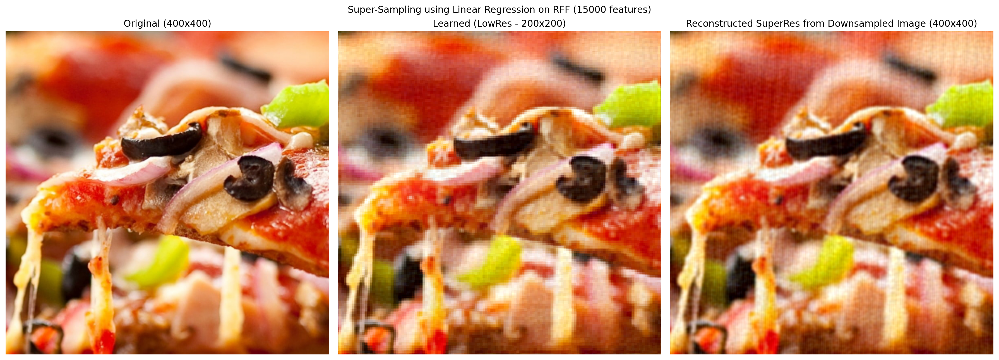

In [ ]:
loss, psnr = super_sample_with_rff(X_coords_scaled, downsampled_img.shape, Y_values, 15000, 2)
metrics[15000] = {'loss':loss, 'psnr':psnr}

Training from input tensor (X) of size: torch.Size([40000, 30000])
Epoch 0 loss: 0.362284
Epoch 500 loss: 0.001656
Epoch 1000 loss: 0.000345
Epoch 1500 loss: 0.000279
Epoch 2000 loss: 0.000271
Making Super-Res image from input tensor (X) of size: torch.Size([160000, 30000])


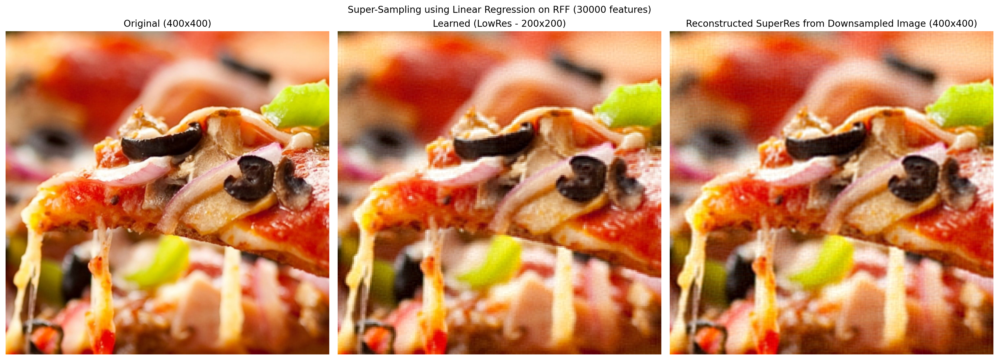

In [ ]:
loss, psnr = super_sample_with_rff(X_coords_scaled, downsampled_img.shape, Y_values, 30000, 2)
metrics[30000] = {'loss':loss, 'psnr':psnr}

## The above only helps us with a qualitative comparison. Let us now do a quantitative comparison. Compute the below given metrics: [1 Marks]
- #### RMSE on predicted v/s ground truth high resolution image
- #### Peak SNR on predicted v/s ground truth high resolution image

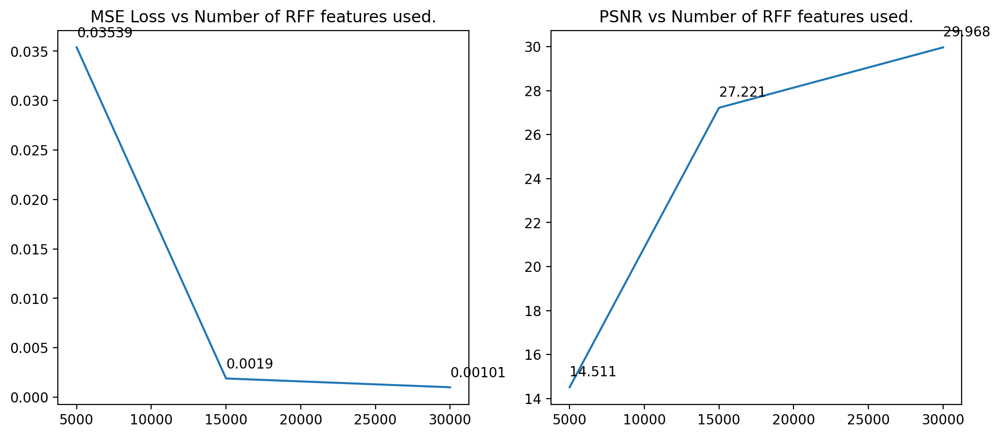

In [ ]:
fig = plt.figure(figsize=(12, 5))
gs = gridspec.GridSpec(1, 2)

# left for losses
ax0 = plt.subplot(gs[0])
losses = [metric['loss'] for metric in list(metrics.values())]
ax0.plot(list(metrics.keys()), losses)
for i,j in zip(list(metrics.keys()),losses):
    ax0.annotate(str(round(j, 5)),xy=(i,j+0.001))
ax0.set_title("MSE Loss vs Number of RFF features used.")

# right for PSNRs
ax1 = plt.subplot(gs[1])
psnrs = [metric['psnr'] for metric in list(metrics.values())]
ax1.plot(list(metrics.keys()), psnrs)
for i,j in zip(list(metrics.keys()),psnrs):
    ax1.annotate(str(round(j, 3)),xy=(i,j+0.5))
ax1.set_title("PSNR vs Number of RFF features used.")

plt.show()